<img align="left" src="images/GMIT-logo.png" alt="GMIT" width="250"/>                                                      <img align="right" src="images/data-analytics.png" alt="HDipDA" width="300"/>  
# <center> Higher Diploma in Data Analytics - Boston House Prices Project </center> #
  

___________________________________________

**Module Name**: Machine Learning & Statistics  
**Module Number**: 52954
**Student Name**: Yvonne Brady  
**Student ID**: G00376355  
___________________________________________  


## (20%) Describe: ##
Create a git repository and make it available online for the lecturer to clone. The repository should contain all your work for this assessment. Within the repository, create a jupyter [6] notebook that uses descriptive statistics and plots to describe the Boston House Prices [1] dataset. This part is worth 20% of your overall mark.

## Introduction ##
This project concerns the Boston House Price Dataset. This dataset is taken from 1970 and records a number of parameters as follows:

**_crim_** : per capita crime rate by town.

**_zn_** : proportion of residential land zoned for lots over 25,000 sq.ft.

**_indus_** : proportion of non-retail business acres per town.

**_chas_** : Charles River dummy variable (= 1 if tract bounds river; 0 otherwise).

**_nox_** : nitrogen oxides concentration (parts per 10 million).

**_rm_** : average number of rooms per dwelling.

**_age_** : proportion of owner-occupied units built prior to 1940.

**_dis_** : weighted mean of distances to five Boston employment centres.

**_rad_** : index of accessibility to radial highways.

**_tax_** : full-value property-tax rate per $10,000.

**_ptratio_** : pupil-teacher ratio by town.

**_black_** : 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town.

**_lstat_** : lower status of the population (percent).

**_medv_** : median value of owner-occupied homes in $1000s.

In [1]:
# First things first - import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as ts ## not ~available and warnings when tried to install - will wait for now
%matplotlib inline 
# Found this and thought it was worth trying ...
import pandas_profiling

In [2]:
from sklearn.datasets import load_boston
bhp = load_boston()

In [3]:
print(bhp.keys())

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])


In [4]:
bhp.DESCR

".. _boston_dataset:\n\nBoston house prices dataset\n---------------------------\n\n**Data Set Characteristics:**  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per $10,000

### Just Prettying up the Description ###
**Data Set Characteristics:**  
Number of Instances: 506  
Number of Attributes: 13  
**Numeric/categorical predictive.**  
Median Value (attribute 14) is usually the target.
**Attribute Information (in order):**  
- CRIM     per capita crime rate by town  
- ZN       proportion of residential land zoned for lots over 25,000 sq.ft.  
- INDUS    proportion of non-retail business acres per town  
- CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)  
- NOX      nitric oxides concentration (parts per 10 million)  
- RM       average number of rooms per dwelling  
- AGE      proportion of owner-occupied units built prior to 1940  
- DIS      weighted distances to five Boston employment centres  
- RAD      index of accessibility to radial highways  
- TAX      full-value property-tax rate per \\$10,000  
- PTRATIO  pupil-teacher ratio by town  
- B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town  
- LSTAT    % lower status of the population  
- MEDV     Median value of owner-occupied homes in $1000's

**Missing Attribute Values:** None  

**Creator:** Harrison, D. and Rubinfeld, D.L.  
This is a copy of UCI ML housing dataset.
https://archive.ics.uci.edu/ml/machine-learning-databases/housing/  
This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University.  
The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic prices and the demand for clean air', J. Environ. Economics & Management, vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics...', Wiley, 1980.  
N.B. Various transformations are used in the table on pages 244-261 of the latter.  
The Boston house-price data has been used in many machine learning papers that address regression problems.  

**References**  
- Belsley, Kuh & Welsch, 'Regression diagnostics: Identifying Influential Data and Sources of Collinearity', Wiley, 1980. 244-261.  
- Quinlan,R. (1993). Combining Instance-Based and Model-Based Learning. In Proceedings on the Tenth International Conference of Machine Learning, 236-243, University of Massachusetts, Amherst. Morgan Kaufmann.

In [5]:
# Put the data in a dataframe for easier manipulation
boston = pd.DataFrame(bhp.data, columns=bhp.feature_names)
# And have a look at some random data
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
461,3.69311,0.0,18.10,0.0,0.713,6.376,88.4,2.5671,24.0,666.0,20.2,391.43,14.65
156,2.44668,0.0,19.58,0.0,0.871,5.272,94.0,1.7364,5.0,403.0,14.7,88.63,16.14
65,0.03584,80.0,3.37,0.0,0.398,6.290,17.8,6.6115,4.0,337.0,16.1,396.90,4.67
453,8.24809,0.0,18.10,0.0,0.713,7.393,99.3,2.4527,24.0,666.0,20.2,375.87,16.74
368,4.89822,0.0,18.10,0.0,0.631,4.970,100.0,1.3325,24.0,666.0,20.2,375.52,3.26


In [6]:
# There is no MEDV column so we must add it to the dataframe
boston['MEDV'] = bhp.target
boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
113,0.22212,0.0,10.01,0.0,0.547,6.092,95.4,2.5480,6.0,432.0,17.8,396.90,17.09,18.7
97,0.12083,0.0,2.89,0.0,0.445,8.069,76.0,3.4952,2.0,276.0,18.0,396.90,4.21,38.7
145,2.37934,0.0,19.58,0.0,0.871,6.130,100.0,1.4191,5.0,403.0,14.7,172.91,27.80,13.8
459,6.80117,0.0,18.10,0.0,0.713,6.081,84.4,2.7175,24.0,666.0,20.2,396.90,14.70,20.0
426,12.24720,0.0,18.10,0.0,0.584,5.837,59.7,1.9976,24.0,666.0,20.2,24.65,15.69,10.2


In [7]:
profile = pandas_profiling.ProfileReport(boston)
profile

In [8]:
profile_chas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 1])
profile_chas

In [9]:
profile_nochas = pandas_profiling.ProfileReport(boston.loc[boston['CHAS'] == 0])
profile_nochas

In [10]:
# Check for null values
boston.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

## Start Plotting ##

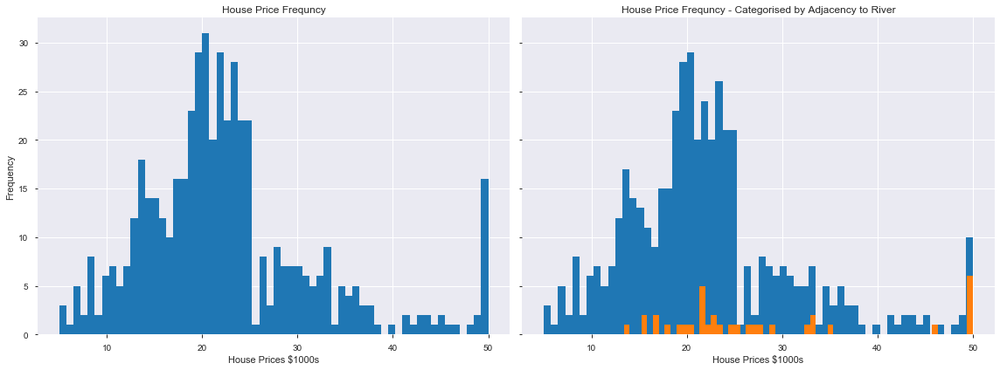

In [11]:

# PLotting histograms showing House Prices in total 
# and where the zone is beside the river
plt.rcParams['figure.figsize'] = [16, 6]
fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)
axs[0].set_xlabel('House Prices $1000s')
axs[1].set_xlabel('House Prices $1000s')
axs[0].set_ylabel('Frequency')
axs[0].set_title("House Price Frequncy")
axs[1].set_title("House Price Frequncy - Categorised by Adjacency to River")
axs[0].hist(boston["MEDV"], bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 0.0), bins = 60)
axs[1].hist(boston["MEDV"].where(boston['CHAS'] == 1.0), bins = 60)

# Tweak spacing to prevent clipping of ylabel
fig.tight_layout()
plt.show()

In [12]:
#Just having a look at the house price element itself
boston["MEDV"].describe()

count    506.000000
mean      22.532806
std        9.197104
min        5.000000
25%       17.025000
50%       21.200000
75%       25.000000
max       50.000000
Name: MEDV, dtype: float64

### What affects house prices? ###
Need to look at each element individually forst to see what affects house prices in particular:  
- CRIM per capita crime rate by town
- ZN proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS proportion of non-retail business acres per town
- NOX nitric oxides concentration (parts per 10 million)
- RM average number of rooms per dwelling
- AGE proportion of owner-occupied units built prior to 1940
- DIS weighted distances to five Boston employment centres
- RAD index of accessibility to radial highways
- TAX full-value property-tax rate per $10,000
- PTRATIO pupil-teacher ratio by town
- B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
- LSTAT % lower status of the population

In [13]:
from scipy import stats
# Get the regression line using all the data
crim_slope, crim_intercept, crim_r2, crim_p, crim_stdErr = stats.linregress(boston["MEDV"], boston["CRIM"])
zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr = stats.linregress(boston["MEDV"], boston["ZN"])
indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr = stats.linregress(boston["MEDV"], boston["INDUS"])
nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr = stats.linregress(boston["MEDV"], boston["NOX"])
rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr = stats.linregress(boston["MEDV"], boston["RM"])
age_slope, age_intercept, age_r2, age_p, age_stdErr = stats.linregress(boston["MEDV"], boston["AGE"])
dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr = stats.linregress(boston["MEDV"], boston["DIS"])
rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr = stats.linregress(boston["MEDV"], boston["RAD"])
tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr = stats.linregress(boston["MEDV"], boston["TAX"])
ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr = stats.linregress(boston["MEDV"], boston["PTRATIO"])
b_slope, b_intercept, b_r2, b_p, b_stdErr = stats.linregress(boston["MEDV"], boston["B"])
lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr = stats.linregress(boston["MEDV"], boston["LSTAT"])

In [14]:
from tabulate import tabulate

In [15]:
table = [["CRIM",crim_slope,crim_intercept, crim_r2, crim_p, crim_stdErr], \
         ["ZN", zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr], \
         ["INDUS", indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr], \
         ["NOX", nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr], \
         ["RM", rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr], \
         ["AGE", age_slope, age_intercept, age_r2, age_p, age_stdErr], \
         ["DIS", dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr], \
         ["RAD", rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr], \
         ["TAX", tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr], \
         ["PTRATIO", ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr], \
         ["B", b_slope, b_intercept, b_r2, b_p, b_stdErr], \
         ["LSTAT", lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr]]
hdr = ["Category", "Slope", "Intercept", "R^2 Value", "P-Value", "Std Error"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+------------+-------------+-------------+-------------+-------------+-------------+
| Category   |       Slope |   Intercept |   R^2 Value |     P-Value |   Std Error |
+============+=============+=============+=============+=============+=============+
| CRIM       | -0.36316    |   11.7965   |   -0.388305 | 1.17399e-19 | 0.0383902   |
+------------+-------------+-------------+-------------+-------------+-------------+
| ZN         |  0.914034   |   -9.23212  |    0.360445 | 5.71358e-17 | 0.105363    |
+------------+-------------+-------------+-------------+-------------+-------------+
| INDUS      | -0.360823   |   19.2671   |   -0.483725 | 4.90026e-31 | 0.0290802   |
+------------+-------------+-------------+-------------+-------------+-------------+
| NOX        | -0.00538397 |    0.676011 |   -0.427321 | 7.06504e-24 | 0.000507399 |
+------------+-------------+-------------+-------------+-------------+-------------+
| RM         |  0.0531224  |    5.08764  |    0.69536  | 2.48723e

The table above shows the best correlations with LSTAT (% of population from lower status), which shows an inverse relationship with house price, and RM (number of rooms). This correlates well with the Correlation tables in the profile above. 

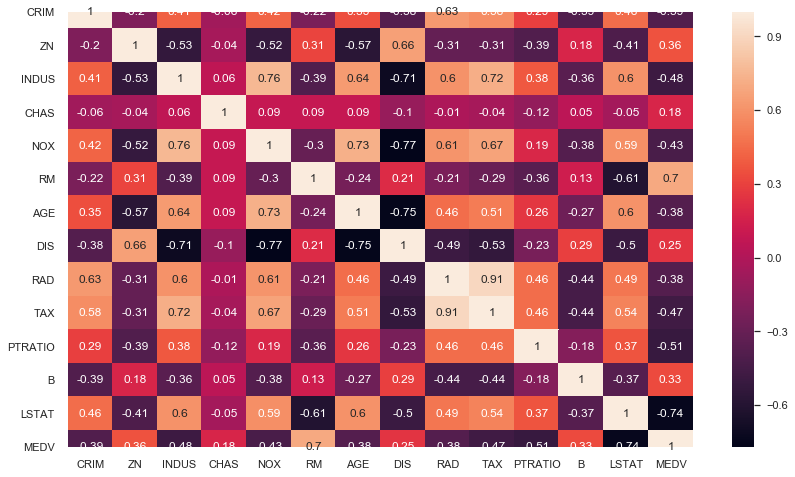

In [16]:
sns.set(rc={'figure.figsize':(14,8)})
# Look at the correlation matrix - tallies well with results above.
correlation_matrix = boston.corr().round(2)
# annot = True to print the values inside the square
sns.heatmap(data=correlation_matrix, annot=True)

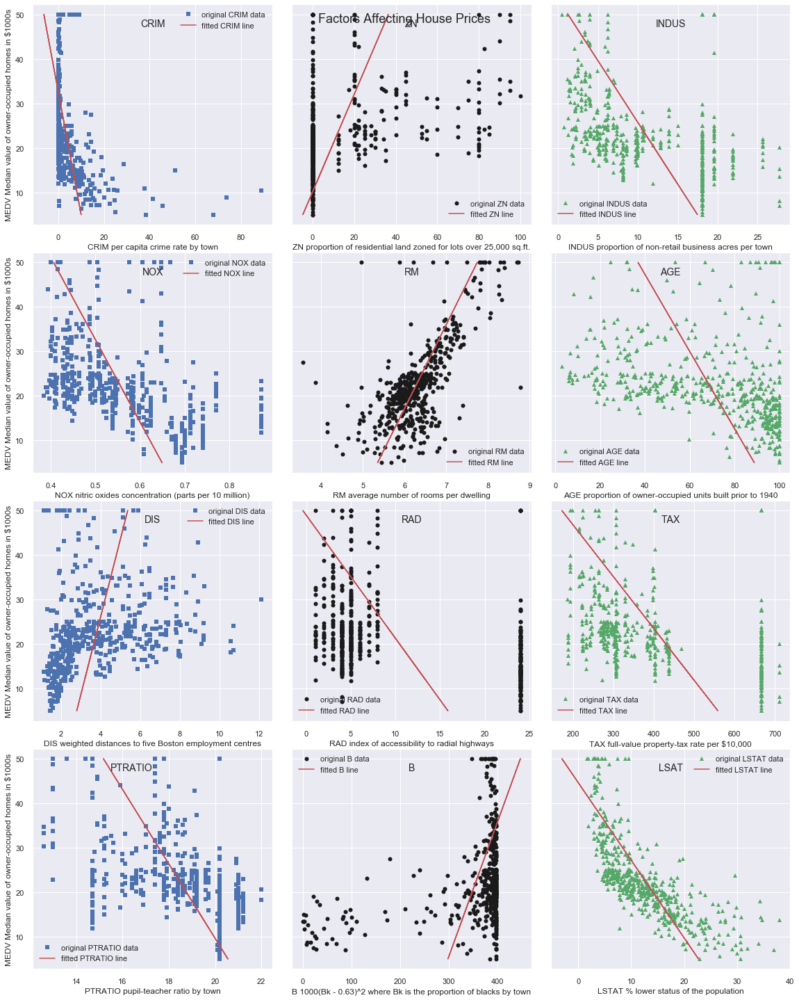

In [17]:
plt.rcParams['figure.figsize'] = [16,20]

# Plot both the raw data and the "best fit" lines
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), ( ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, sharey=True)
fig.tight_layout()

ax1.plot(boston["CRIM"], boston["MEDV"], 'bs', label='original CRIM data')
ax1.plot(crim_intercept + crim_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted CRIM line')
ax1.legend()
ax2.plot(boston["ZN"], boston["MEDV"], 'ko', label='original ZN data')
ax2.plot(zn_intercept + zn_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted ZN line')
ax2.legend()
ax3.plot(boston["INDUS"], boston["MEDV"], 'g^', label='original INDUS data')
ax3.plot(indus_intercept + indus_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted INDUS line')
ax3.legend()
ax4.plot(boston["NOX"], boston["MEDV"], 'bs', label='original NOX data')
ax4.plot(nox_intercept + nox_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted NOX line')
ax4.legend()
ax5.plot(boston["RM"], boston["MEDV"], 'ko', label='original RM data')
ax5.plot(rm_intercept + rm_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RM line')
ax5.legend()
ax6.plot(boston["AGE"], boston["MEDV"], 'g^', label='original AGE data')
ax6.plot(age_intercept + age_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted AGE line')
ax6.legend()
ax7.plot(boston["DIS"], boston["MEDV"], 'bs', label='original DIS data')
ax7.plot(dis_intercept + dis_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted DIS line')
ax7.legend()
ax8.plot(boston["RAD"], boston["MEDV"], 'ko', label='original RAD data')
ax8.plot(rad_intercept + rad_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RAD line')
ax8.legend()
ax9.plot(boston["TAX"], boston["MEDV"], 'g^', label='original TAX data')
ax9.plot(tax_intercept + tax_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted TAX line')
ax9.legend()
ax10.plot(boston["PTRATIO"], boston["MEDV"], 'bs', label='original PTRATIO data')
ax10.plot(ptratio_intercept + ptratio_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted PTRATIO line')
ax10.legend()
ax11.plot(boston["B"], boston["MEDV"], 'ko', label='original B data')
ax11.plot(b_intercept + b_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted B line')
ax11.legend()
ax12.plot(boston["LSTAT"], boston["MEDV"], 'g^', label='original LSTAT data')
ax12.plot(lstat_intercept + lstat_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted LSTAT line')
ax12.legend()

# Set labels
ax1.set_xlabel('CRIM per capita crime rate by town')
ax2.set_xlabel('ZN proportion of residential land zoned for lots over 25,000 sq.ft.')
ax3.set_xlabel('INDUS proportion of non-retail business acres per town')
ax4.set_xlabel('NOX nitric oxides concentration (parts per 10 million)')
ax5.set_xlabel('RM average number of rooms per dwelling')
ax6.set_xlabel('AGE proportion of owner-occupied units built prior to 1940')
ax7.set_xlabel('DIS weighted distances to five Boston employment centres')
ax8.set_xlabel('RAD index of accessibility to radial highways')
ax9.set_xlabel('TAX full-value property-tax rate per $10,000')
ax10.set_xlabel('PTRATIO pupil-teacher ratio by town')
ax11.set_xlabel('B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town')
ax12.set_xlabel('LSTAT % lower status of the population')
ax1.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax4.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax7.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax10.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')

# Titles
fig.suptitle('Factors Affecting House Prices', fontsize=18)

ax1.text(.5,.9,'CRIM', horizontalalignment='center',transform=ax1.transAxes,fontsize=14)
ax2.text(.5,.9,'ZN', horizontalalignment='center',transform=ax2.transAxes,fontsize=14)
ax3.text(.5,.9,'INDUS', horizontalalignment='center',transform=ax3.transAxes,fontsize=14)
ax4.text(.5,.9,'NOX', horizontalalignment='center',transform=ax4.transAxes,fontsize=14)
ax5.text(.5,.9,'RM', horizontalalignment='center',transform=ax5.transAxes,fontsize=14)
ax6.text(.5,.9,'AGE', horizontalalignment='center',transform=ax6.transAxes,fontsize=14)
ax7.text(.5,.9,'DIS', horizontalalignment='center',transform=ax7.transAxes,fontsize=14)
ax8.text(.5,.9,'RAD', horizontalalignment='center',transform=ax8.transAxes,fontsize=14)
ax9.text(.5,.9,'TAX', horizontalalignment='center',transform=ax9.transAxes,fontsize=14)
ax10.text(.5,.9,'PTRATIO', horizontalalignment='right',transform=ax10.transAxes,fontsize=14)
ax11.text(.5,.9,'B', horizontalalignment='center',transform=ax11.transAxes,fontsize=14)
ax12.text(.5,.9,'LSAT', horizontalalignment='center',transform=ax12.transAxes,fontsize=14)
plt.show()

Looking at the plots individually, we can hypothesise on possible correlations. It is likely many of these supposed correlations will be more imagined than real, but we will explore them nonetheless as this may help us spot fake relationships in the future.  
  
**CRIM**: Within the entire dataset there appears to be no relationship, but may warrant further scrutiny where the crime rate is 0.  
**ZN**: Similar to the crime rate. We could look at any relationship where the 0 values are excluded.  
**INDUS**: Could look at excluding house prices under \\$40K   
**NOX**: Similar to INDUS, could exclude the higher priced homes. Unsurprisingly this plot tallies with the INDUS plot.   
**RM**:  A clear linear proportional relationship exists.  
**AGE**: Possible relationship excluding the higher priced homes.  
**DIS**: There may be a $y = a \sqrt{x} $ relationship  
**RAD**: Struggling to find any kind of relationship here.  
**TAX**: Again, no obvious relationship barring a general trend toward higher taxes meaning lower house prices, but the data values are very spread for this to pursue.  
**PTRATIO**: Similar to the TAX plot above  
**B**: Could look at relationship excluding upper-end B values  
**LSTAT**: While this shows one of the best $r^2$ values the shape of the graph may warrant whether a $y=\frac{1}{x}$ may be a better fit here.

It is likely that many of these relationships are not worthy of further investigation.

**Investigation of adjustments described above**

In [18]:
boston_nocrim = boston.loc[boston["CRIM"] > 2]
boston_nozn = boston.loc[boston["ZN"]>5]

In [19]:
crim0_slope, crim0_intercept, crim0_r2, crim0_p, crim0_stdErr = stats.linregress(boston_nocrim["MEDV"], boston_nocrim["CRIM"])
zn0_slope, zn0_intercept, zn0_r2, zn0_p, zn0_stdErr = stats.linregress(boston_nozn["MEDV"], boston_nozn["ZN"])


In [20]:
print("Full dataset r^2 values for CRIM (", len(boston),") vs adjusted CRIM (", len(boston_nocrim),"):", crim_r2, "vs",crim0_r2)
print("Full dataset r^2 values for ZN (", len(boston),") vs adjusted ZN (", len(boston_nozn),"):", zn_r2, "vs", zn0_r2)


Full dataset r^2 values for CRIM ( 506 ) vs adjusted CRIM ( 150 ): -0.3883046085868113 vs -0.3486104206965284
Full dataset r^2 values for ZN ( 506 ) vs adjusted ZN ( 134 ): 0.3604453424505433 vs 0.20841302081053192


**Multi-Linear Regression**  
Looking at the two variables, RM and LSTAt - try using multi-linear regression

In [21]:
# Import linear_model from sklearn
import sklearn.linear_model as ln

In [22]:
# Create a linear regression model instance
m = ln.LinearRegression()

In [23]:
x = boston[["RM","LSTAT"]] # comparing against the best two variables
y = boston["MEDV"]

In [24]:
m.fit(x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [25]:
# See how well it fit:
m.score(x,y)

0.6385616062603403

This value is lower than either the RM or LSTAT R2 values!

In [26]:
x = boston[["RM", "INDUS"]]
m.fit(x,y)
m.score(x,y)

0.5362984005856312

In [27]:
# And the data where is is adjacent to the river
boston["MEDV"].where(boston['CHAS'] == 1.0).describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [28]:
# Focus on only the Zones Where CHAS is 1
np.unique(boston[['ZN','CHAS']], axis=0)
boston["ZN"].unique()

array([ 18. ,   0. ,  12.5,  75. ,  21. ,  90. ,  85. , 100. ,  25. ,
        17.5,  80. ,  28. ,  45. ,  60. ,  95. ,  82.5,  30. ,  22. ,
        20. ,  40. ,  55. ,  52.5,  70. ,  34. ,  33. ,  35. ])

In [29]:
boston.loc[boston['CHAS'] == 1]

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
142,3.32105,0.0,19.58,1.0,0.8710,5.403,100.0,1.3216,5.0,403.0,14.7,396.90,26.82,13.4
152,1.12658,0.0,19.58,1.0,0.8710,5.012,88.0,1.6102,5.0,403.0,14.7,343.28,12.12,15.3
154,1.41385,0.0,19.58,1.0,0.8710,6.129,96.0,1.7494,5.0,403.0,14.7,321.02,15.12,17.0
155,3.53501,0.0,19.58,1.0,0.8710,6.152,82.6,1.7455,5.0,403.0,14.7,88.01,15.02,15.6
160,1.27346,0.0,19.58,1.0,0.6050,6.250,92.6,1.7984,5.0,403.0,14.7,338.92,5.50,27.0
162,1.83377,0.0,19.58,1.0,0.6050,7.802,98.2,2.0407,5.0,403.0,14.7,389.61,1.92,50.0
163,1.51902,0.0,19.58,1.0,0.6050,8.375,93.9,2.1620,5.0,403.0,14.7,388.45,3.32,50.0
208,0.13587,0.0,10.59,1.0,0.4890,6.064,59.1,4.2392,4.0,277.0,18.6,381.32,14.66,24.4
209,0.43571,0.0,10.59,1.0,0.4890,5.344,100.0,3.8750,4.0,277.0,18.6,396.90,23.09,20.0
210,0.17446,0.0,10.59,1.0,0.4890,5.960,92.1,3.8771,4.0,277.0,18.6,393.25,17.27,21.7


## (20%) Infer: ##
To the above jupyter notebook, add a section where you use inferential
statistics to analyse whether there is a significant difference in median house prices
between houses that are along the Charles river and those that aren’t. You should
explain and discuss your findings within the notebook. This part is also worth
20%.

<img src="images/Charles-River.jpg"/>

In [30]:
# Let#'s have a look at the stats for properties beside the Charles River
boston.loc[boston['CHAS'] == 1].describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,35.000000,35.000000,35.000000,35.0,35.000000,35.000000,35.00000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1.851670,7.714286,12.719143,1.0,0.593426,6.519600,77.50000,3.029709,9.314286,386.257143,17.491429,372.997429,11.241714,28.440000
std,2.494072,18.800143,5.957623,0.0,0.144736,0.876416,22.02134,1.254728,8.248962,165.012004,2.081766,53.382820,6.686651,11.816643
min,0.015010,0.000000,1.210000,1.0,0.401000,5.012000,24.80000,1.129600,1.000000,198.000000,13.600000,88.010000,1.920000,13.400000
25%,0.125060,0.000000,6.410000,1.0,0.489000,5.935500,60.30000,1.904700,4.000000,276.000000,15.650000,376.200000,5.395000,21.100000
50%,0.447910,0.000000,13.890000,1.0,0.550000,6.250000,88.50000,3.048000,5.000000,307.000000,17.600000,390.770000,10.500000,23.300000
75%,3.397665,0.000000,18.100000,1.0,0.693000,6.915000,93.20000,3.897300,8.000000,403.000000,18.600000,393.595000,15.070000,33.150000
max,8.982960,90.000000,19.580000,1.0,0.871000,8.780000,100.00000,5.885000,24.000000,666.000000,20.200000,396.900000,26.820000,50.000000


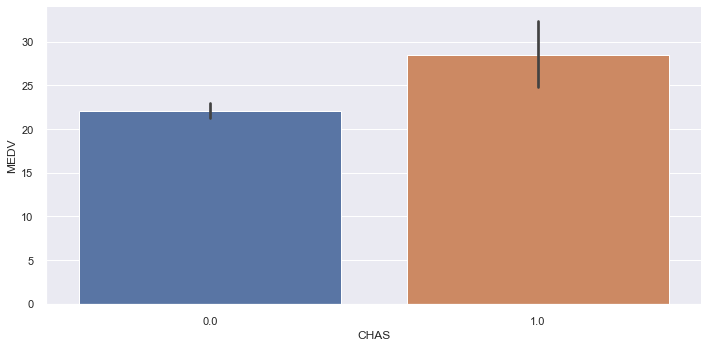

In [31]:
sns.catplot(height=5, aspect=2, x = 'CHAS', y ='MEDV', data = boston, kind = "bar")

In [32]:
boston.loc[boston['CHAS'] == 1]["MEDV"].describe()

count    35.000000
mean     28.440000
std      11.816643
min      13.400000
25%      21.100000
50%      23.300000
75%      33.150000
max      50.000000
Name: MEDV, dtype: float64

In [33]:
boston.loc[boston['CHAS'] == 0]["MEDV"].describe()

count    471.000000
mean      22.093843
std        8.831362
min        5.000000
25%       16.600000
50%       20.900000
75%       24.800000
max       50.000000
Name: MEDV, dtype: float64

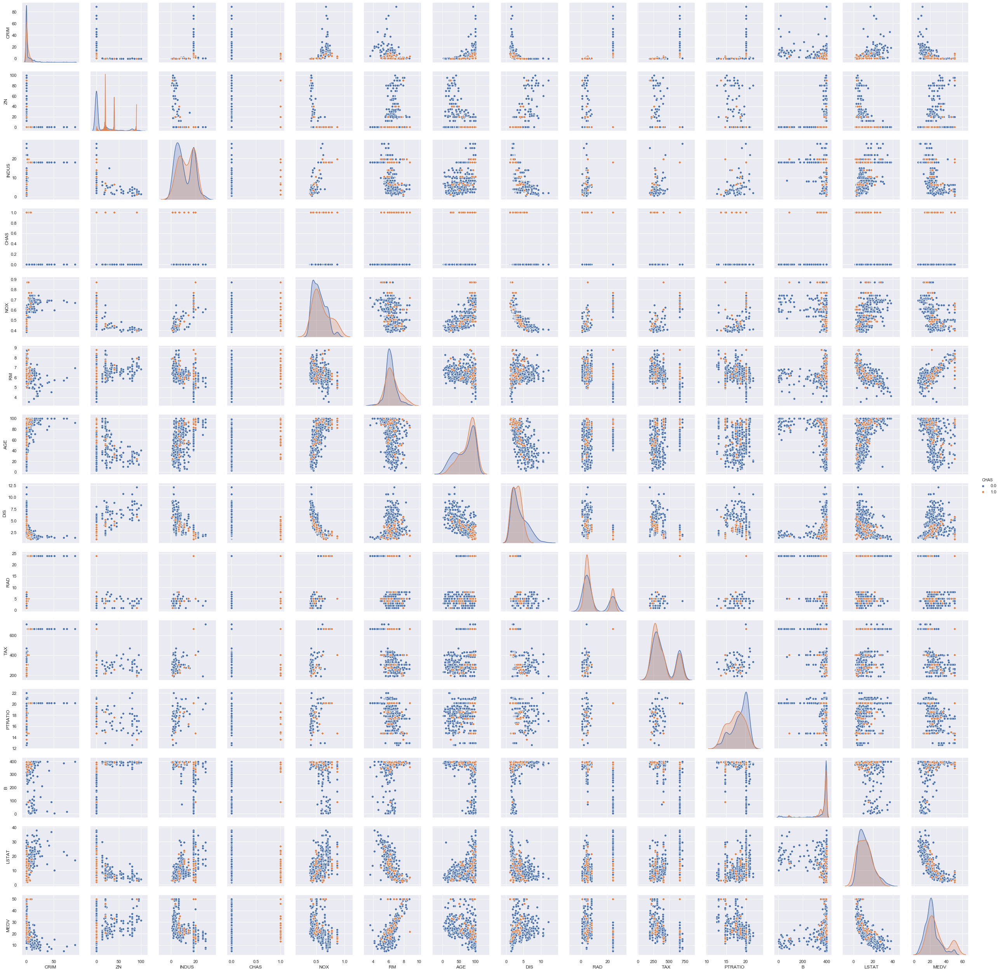

In [34]:
# A 14 x14 plot! 
sns.pairplot(boston, hue = "CHAS")

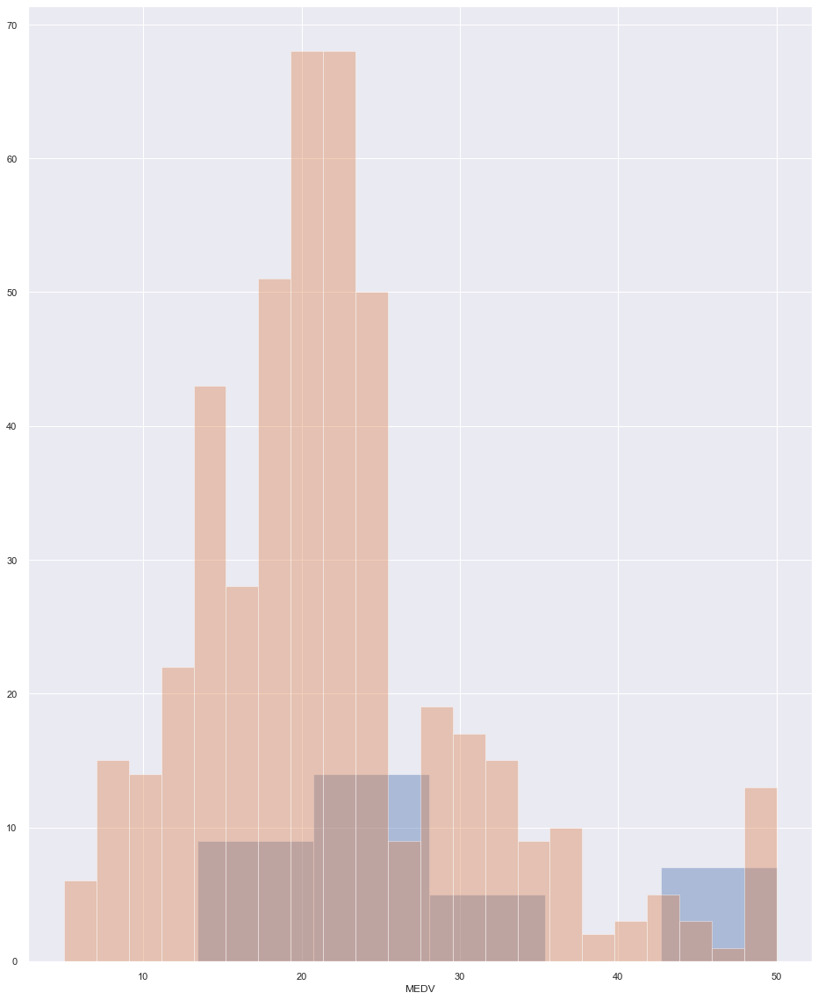

In [35]:
sns.distplot(boston.loc[boston['CHAS'] == 1]["MEDV"],  kde=False,label='Next to River')
sns.distplot(boston.loc[boston['CHAS'] != 1]["MEDV"],  kde=False,label='Not Next to River')

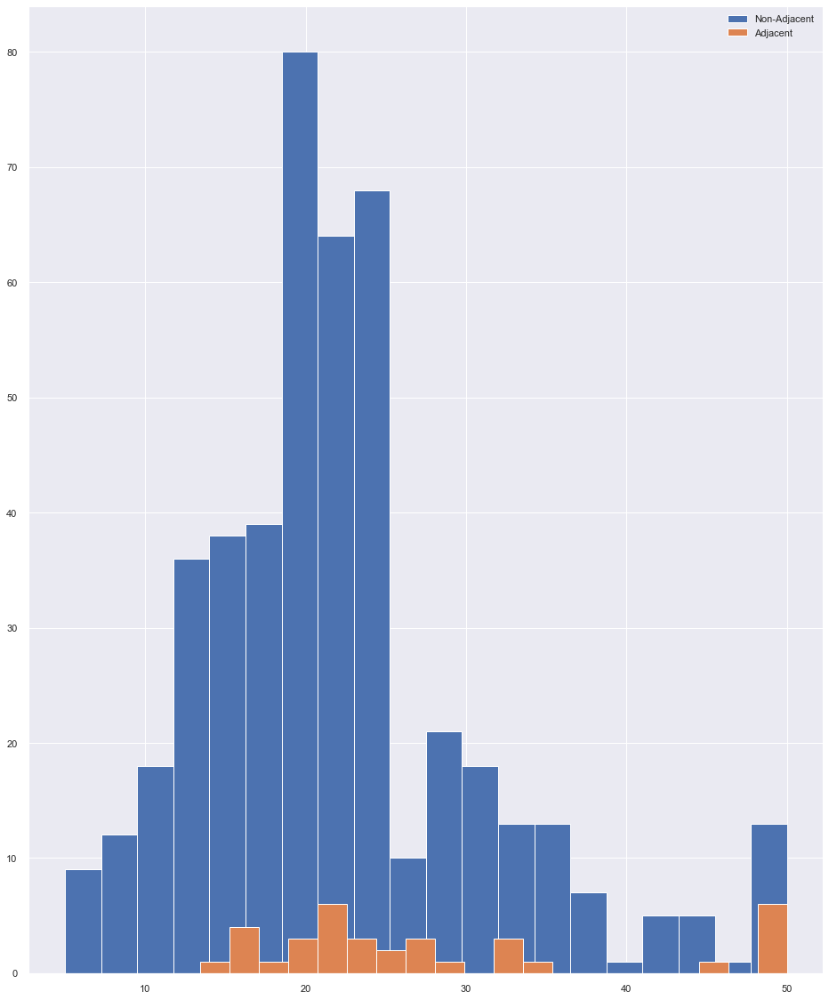

In [36]:
plt.hist(boston.loc[boston['CHAS'] != 1]["MEDV"], label='Non-Adjacent', bins = 20)
plt.hist(boston.loc[boston['CHAS'] == 1]["MEDV"], label='Adjacent', bins = 20)

plt.legend()

plt.show()

In [37]:
# Perform t-test on the two datasets:
import scipy.stats as stats
stats.ttest_ind(boston.loc[boston['CHAS'] == 1]["MEDV"], boston.loc[boston['CHAS'] == 0]["MEDV"])

Ttest_indResult(statistic=3.996437466090509, pvalue=7.390623170519905e-05)

The result above would indicate that these datasets were distinctly different with only a very small probability of the two being confused (p-value of 7.4 x 10^-5). This would appear at odds with the visual appearance of the histogram above however.  

Taking a closer look at the histogram - there appears to be a large amount of outliers in those houses adjacent to the Charles River.

In [38]:
#boston.loc[boston["MEDV"]<50.0, boston['CHAS'] == 1 ]["MEDV"]
no_chas = boston.loc[boston['CHAS'] == 0]
yes_chas = boston.loc[boston['CHAS'] == 1]

In [39]:
# Perform t-test on the two amended datasets:
stats.ttest_ind(no_chas.loc[no_chas['MEDV'] < 50.0]["MEDV"],yes_chas.loc[yes_chas["MEDV"] < 50.0]["MEDV"])

Ttest_indResult(statistic=-1.6571053443179937, pvalue=0.09814089320087695)

**Outliers**  
It is clear from the analysis to date that there appears to be a problem with the data at the higher end of the MEDV pricing. The upper limit of values appears capped at $50K. 

In [40]:
print(f"The number of rows with a MEDV value of $50K is {len(boston.loc[boston['MEDV'] == 50.0])}, which represents {len(boston.loc[boston['MEDV'] == 50.0])*100/len(boston)}% of the values")

The number of rows with a MEDV value of $50K is 16, which represents 3.1620553359683794% of the values


In [41]:
# List the top 5 most frequent house prices
boston['MEDV'].value_counts().head()

50.0    16
25.0     8
23.1     7
21.7     7
22.0     7
Name: MEDV, dtype: int64

This is at twice the frequency of any and every other value. It is likely that there was a cap put on the upper end of the MEDV values and as such this contaminates the dataset. We have no way of knowing if the \\$50K is really \\$50K or \\$50M or more. We must therefore exclude these values from further analysis.   

Rather than just pick on this value we will exclude values that fall outside two standard deviations of the mean. This should to exclude any other less obvious issues.

In [42]:
# Remove all rows where the specified column is +/- sd standard deviations
def remove_outliers(df, name, sd):
    drop_rows = df.index[(np.abs(df[name] - df[name].mean())
                          >= (sd * df[name].std()))]
    df.drop(drop_rows, axis=0, inplace=True)

In [43]:
remove_outliers(boston, "MEDV", 2)


Re-analysis

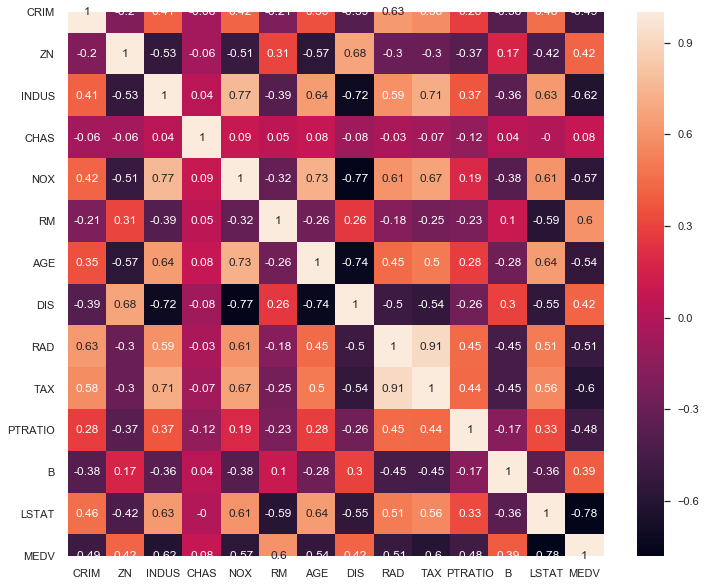

In [44]:
sns.set(rc={'figure.figsize':(12,10)})
# Look at the correlation matrix - tallies well with results above.
correlation_matrix = boston.corr().round(2)
# annot = True to print the values inside the square
sns.heatmap(data=correlation_matrix, annot=True)

In [45]:
# Get the regression lines using the non-outlier data
crim_slope, crim_intercept, crim_r2, crim_p, crim_stdErr = stats.linregress(boston["MEDV"], boston["CRIM"])
zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr = stats.linregress(boston["MEDV"], boston["ZN"])
indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr = stats.linregress(boston["MEDV"], boston["INDUS"])
nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr = stats.linregress(boston["MEDV"], boston["NOX"])
rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr = stats.linregress(boston["MEDV"], boston["RM"])
age_slope, age_intercept, age_r2, age_p, age_stdErr = stats.linregress(boston["MEDV"], boston["AGE"])
dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr = stats.linregress(boston["MEDV"], boston["DIS"])
rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr = stats.linregress(boston["MEDV"], boston["RAD"])
tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr = stats.linregress(boston["MEDV"], boston["TAX"])
ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr = stats.linregress(boston["MEDV"], boston["PTRATIO"])
b_slope, b_intercept, b_r2, b_p, b_stdErr = stats.linregress(boston["MEDV"], boston["B"])
lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr = stats.linregress(boston["MEDV"], boston["LSTAT"])

Removing the outliers has a significant effect on the correlation coefficients with respect to MEDV. Previously, with the outliers included only LSTAT (-0.74), RM (0.7) and PTRATIO (-0.51) had absolute coefficients greater than 0.5. With the outliers removed INDUS(-0.62), NOX(-0.57), AGE (-0.54), RAD(-0.51), TAX (-0.6) are also included in that list. Interestingly however PTRATIO has decreased to -0.48 and RM, one of the two most highly correlated variables has decreased to 0.6 from 0.7.

In [46]:
table = [["CRIM",crim_slope,crim_intercept, crim_r2, crim_p, crim_stdErr], \
         ["ZN", zn_slope, zn_intercept, zn_r2, zn_p, zn_stdErr], \
         ["INDUS", indus_slope, indus_intercept, indus_r2, indus_p, indus_stdErr], \
         ["NOX", nox_slope, nox_intercept, nox_r2, nox_p, nox_stdErr], \
         ["RM", rm_slope, rm_intercept, rm_r2, rm_p, rm_stdErr], \
         ["AGE", age_slope, age_intercept, age_r2, age_p, age_stdErr], \
         ["DIS", dis_slope, dis_intercept, dis_r2, dis_p, dis_stdErr], \
         ["RAD", rad_slope, rad_intercept, rad_r2, rad_p, rad_stdErr], \
         ["TAX", tax_slope, tax_intercept, tax_r2, tax_p, tax_stdErr], \
         ["PTRATIO", ptratio_slope, ptratio_intercept, ptratio_r2, ptratio_p, ptratio_stdErr], \
         ["B", b_slope, b_intercept, b_r2, b_p, b_stdErr], \
         ["LSTAT", lstat_slope, lstat_intercept, lstat_r2, lstat_p, lstat_stdErr]]
hdr = ["Category", "Slope", "Intercept", "R^2 Value", "P-Value", "Std Error"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+------------+--------------+-------------+-------------+-------------+-------------+
| Category   |        Slope |   Intercept |   R^2 Value |     P-Value |   Std Error |
+============+==============+=============+=============+=============+=============+
| CRIM       |  -0.634937   |   17.0222   |   -0.488403 | 7.62853e-30 | 0.0521609   |
+------------+--------------+-------------+-------------+-------------+-------------+
| ZN         |   1.37515    |  -18.1065   |    0.419465 | 1.14894e-21 | 0.136836    |
+------------+--------------+-------------+-------------+-------------+-------------+
| INDUS      |  -0.621985   |   24.2989   |   -0.620829 | 5.85041e-52 | 0.036113    |
+------------+--------------+-------------+-------------+-------------+-------------+
| NOX        |  -0.00983621 |    0.761699 |   -0.5706   | 2.22557e-42 | 0.000650922 |
+------------+--------------+-------------+-------------+-------------+-------------+
| RM         |   0.0527443  |    5.09299  |    0.60275

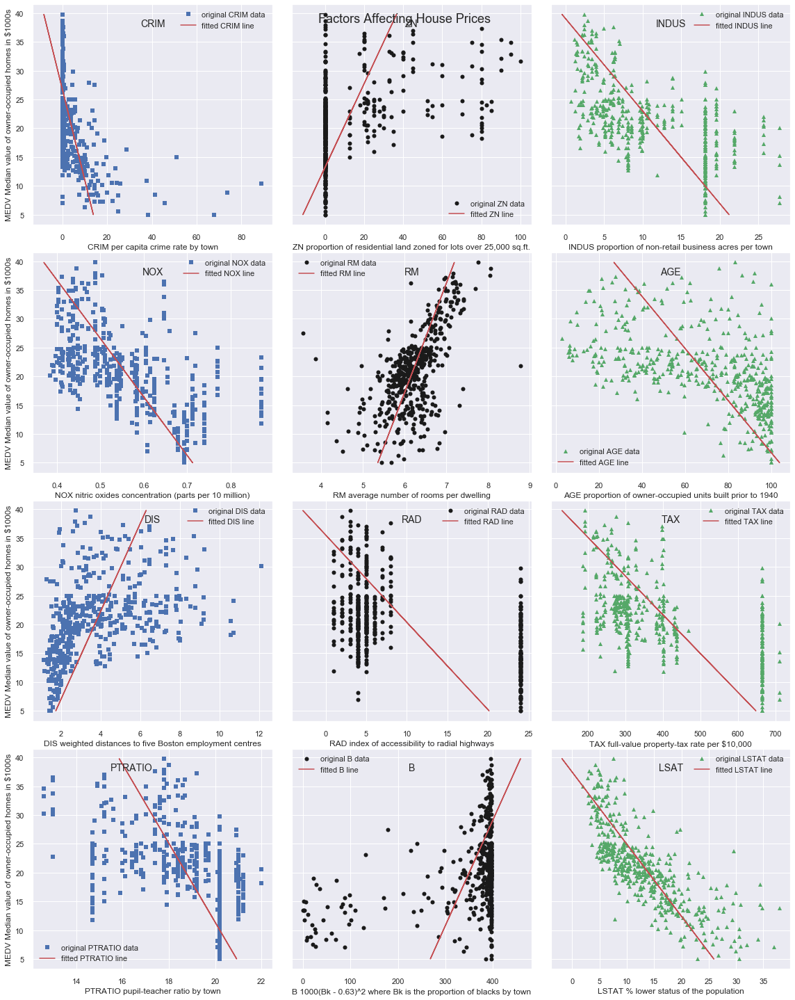

In [47]:
plt.rcParams['figure.figsize'] = [16,20]

# Plot both the raw data and the "best fit" lines
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), ( ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, sharey=True)
fig.tight_layout()

ax1.plot(boston["CRIM"], boston["MEDV"], 'bs', label='original CRIM data')
ax1.plot(crim_intercept + crim_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted CRIM line')
ax1.legend()
ax2.plot(boston["ZN"], boston["MEDV"], 'ko', label='original ZN data')
ax2.plot(zn_intercept + zn_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted ZN line')
ax2.legend()
ax3.plot(boston["INDUS"], boston["MEDV"], 'g^', label='original INDUS data')
ax3.plot(indus_intercept + indus_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted INDUS line')
ax3.legend()
ax4.plot(boston["NOX"], boston["MEDV"], 'bs', label='original NOX data')
ax4.plot(nox_intercept + nox_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted NOX line')
ax4.legend()
ax5.plot(boston["RM"], boston["MEDV"], 'ko', label='original RM data')
ax5.plot(rm_intercept + rm_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RM line')
ax5.legend()
ax6.plot(boston["AGE"], boston["MEDV"], 'g^', label='original AGE data')
ax6.plot(age_intercept + age_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted AGE line')
ax6.legend()
ax7.plot(boston["DIS"], boston["MEDV"], 'bs', label='original DIS data')
ax7.plot(dis_intercept + dis_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted DIS line')
ax7.legend()
ax8.plot(boston["RAD"], boston["MEDV"], 'ko', label='original RAD data')
ax8.plot(rad_intercept + rad_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted RAD line')
ax8.legend()
ax9.plot(boston["TAX"], boston["MEDV"], 'g^', label='original TAX data')
ax9.plot(tax_intercept + tax_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted TAX line')
ax9.legend()
ax10.plot(boston["PTRATIO"], boston["MEDV"], 'bs', label='original PTRATIO data')
ax10.plot(ptratio_intercept + ptratio_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted PTRATIO line')
ax10.legend()
ax11.plot(boston["B"], boston["MEDV"], 'ko', label='original B data')
ax11.plot(b_intercept + b_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted B line')
ax11.legend()
ax12.plot(boston["LSTAT"], boston["MEDV"], 'g^', label='original LSTAT data')
ax12.plot(lstat_intercept + lstat_slope*boston["MEDV"], boston["MEDV"], 'r', label='fitted LSTAT line')
ax12.legend()

# Set labels
ax1.set_xlabel('CRIM per capita crime rate by town')
ax2.set_xlabel('ZN proportion of residential land zoned for lots over 25,000 sq.ft.')
ax3.set_xlabel('INDUS proportion of non-retail business acres per town')
ax4.set_xlabel('NOX nitric oxides concentration (parts per 10 million)')
ax5.set_xlabel('RM average number of rooms per dwelling')
ax6.set_xlabel('AGE proportion of owner-occupied units built prior to 1940')
ax7.set_xlabel('DIS weighted distances to five Boston employment centres')
ax8.set_xlabel('RAD index of accessibility to radial highways')
ax9.set_xlabel('TAX full-value property-tax rate per $10,000')
ax10.set_xlabel('PTRATIO pupil-teacher ratio by town')
ax11.set_xlabel('B 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town')
ax12.set_xlabel('LSTAT % lower status of the population')
ax1.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax4.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax7.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')
ax10.set_ylabel('MEDV Median value of owner-occupied homes in $1000s')

# Titles
fig.suptitle('Factors Affecting House Prices', fontsize=18)

ax1.text(.5,.9,'CRIM', horizontalalignment='center',transform=ax1.transAxes,fontsize=14)
ax2.text(.5,.9,'ZN', horizontalalignment='center',transform=ax2.transAxes,fontsize=14)
ax3.text(.5,.9,'INDUS', horizontalalignment='center',transform=ax3.transAxes,fontsize=14)
ax4.text(.5,.9,'NOX', horizontalalignment='center',transform=ax4.transAxes,fontsize=14)
ax5.text(.5,.9,'RM', horizontalalignment='center',transform=ax5.transAxes,fontsize=14)
ax6.text(.5,.9,'AGE', horizontalalignment='center',transform=ax6.transAxes,fontsize=14)
ax7.text(.5,.9,'DIS', horizontalalignment='center',transform=ax7.transAxes,fontsize=14)
ax8.text(.5,.9,'RAD', horizontalalignment='center',transform=ax8.transAxes,fontsize=14)
ax9.text(.5,.9,'TAX', horizontalalignment='center',transform=ax9.transAxes,fontsize=14)
ax10.text(.5,.9,'PTRATIO', horizontalalignment='right',transform=ax10.transAxes,fontsize=14)
ax11.text(.5,.9,'B', horizontalalignment='center',transform=ax11.transAxes,fontsize=14)
ax12.text(.5,.9,'LSAT', horizontalalignment='center',transform=ax12.transAxes,fontsize=14)
plt.show()

In [48]:
# Perform t-test on the with putliers removed:
stats.ttest_ind(boston.loc[boston['CHAS'] < 1]["MEDV"],boston.loc[boston["CHAS"] == 1.0]["MEDV"])

Ttest_indResult(statistic=-1.8389265568521393, pvalue=0.06655266530833404)

With the outliers removed - it is not possible to distinguish the two datasets.

In [49]:
import keras as ks

Using TensorFlow backend.


In [50]:
boston_all = pd.DataFrame(bhp.data, columns=bhp.feature_names)

In [51]:
from sklearn import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping

In [52]:
# Divide the dataset into inputs and outputs
# Inputs = the data we know
# Output = what we are looking for
inputs_no = boston[['LSTAT', 'RM', 'INDUS', 'AGE','TAX', 'PTRATIO']]
outputs_no = boston['MEDV']
# Build the neural network
model_no = Sequential()
model_no.add(Dense(25, input_dim=inputs_no.shape[1], activation='relu')) # Hidden 1
model_no.add(Dense(10, activation='relu')) # Hidden 2
model_no.add(Dense(1)) # Output
model_no.compile(loss='mean_squared_error', optimizer='adam')
model_no.fit(inputs_no,outputs_no,verbose=2,epochs=1000)

Train on 475 samples
Epoch 1/1000
475/475 - 0s - loss: 262.6126
Epoch 2/1000
475/475 - 0s - loss: 143.6242
Epoch 3/1000
475/475 - 0s - loss: 132.2602
Epoch 4/1000
475/475 - 0s - loss: 124.8331
Epoch 5/1000
475/475 - 0s - loss: 120.9706
Epoch 6/1000
475/475 - 0s - loss: 118.9804
Epoch 7/1000
475/475 - 0s - loss: 116.1894
Epoch 8/1000
475/475 - 0s - loss: 113.8986
Epoch 9/1000
475/475 - 0s - loss: 111.3494
Epoch 10/1000
475/475 - 0s - loss: 108.7698
Epoch 11/1000
475/475 - 0s - loss: 104.2676
Epoch 12/1000
475/475 - 0s - loss: 99.3764
Epoch 13/1000
475/475 - 0s - loss: 94.7709
Epoch 14/1000
475/475 - 0s - loss: 90.2319
Epoch 15/1000
475/475 - 0s - loss: 85.2782
Epoch 16/1000
475/475 - 0s - loss: 79.1344
Epoch 17/1000
475/475 - 0s - loss: 71.6037
Epoch 18/1000
475/475 - 0s - loss: 64.9724
Epoch 19/1000
475/475 - 0s - loss: 58.1480
Epoch 20/1000
475/475 - 0s - loss: 52.1354
Epoch 21/1000
475/475 - 0s - loss: 46.6998
Epoch 22/1000
475/475 - 0s - loss: 42.5614
Epoch 23/1000
475/475 - 0s - lo

Epoch 189/1000
475/475 - 0s - loss: 15.1681
Epoch 190/1000
475/475 - 0s - loss: 15.1076
Epoch 191/1000
475/475 - 0s - loss: 14.8336
Epoch 192/1000
475/475 - 0s - loss: 15.0247
Epoch 193/1000
475/475 - 0s - loss: 16.3469
Epoch 194/1000
475/475 - 0s - loss: 16.9518
Epoch 195/1000
475/475 - 0s - loss: 15.6053
Epoch 196/1000
475/475 - 0s - loss: 14.5669
Epoch 197/1000
475/475 - 0s - loss: 14.9522
Epoch 198/1000
475/475 - 0s - loss: 14.6772
Epoch 199/1000
475/475 - 0s - loss: 14.5715
Epoch 200/1000
475/475 - 0s - loss: 14.9204
Epoch 201/1000
475/475 - 0s - loss: 15.3547
Epoch 202/1000
475/475 - 0s - loss: 15.4757
Epoch 203/1000
475/475 - 0s - loss: 15.5008
Epoch 204/1000
475/475 - 0s - loss: 14.8858
Epoch 205/1000
475/475 - 0s - loss: 14.3638
Epoch 206/1000
475/475 - 0s - loss: 14.2581
Epoch 207/1000
475/475 - 0s - loss: 14.6400
Epoch 208/1000
475/475 - 0s - loss: 14.5348
Epoch 209/1000
475/475 - 0s - loss: 14.5130
Epoch 210/1000
475/475 - 0s - loss: 14.2846
Epoch 211/1000
475/475 - 0s - lo

Epoch 376/1000
475/475 - 0s - loss: 11.5146
Epoch 377/1000
475/475 - 0s - loss: 10.9881
Epoch 378/1000
475/475 - 0s - loss: 11.0678
Epoch 379/1000
475/475 - 0s - loss: 10.8842
Epoch 380/1000
475/475 - 0s - loss: 11.1819
Epoch 381/1000
475/475 - 0s - loss: 10.9674
Epoch 382/1000
475/475 - 0s - loss: 10.9170
Epoch 383/1000
475/475 - 0s - loss: 10.6805
Epoch 384/1000
475/475 - 0s - loss: 11.4087
Epoch 385/1000
475/475 - 0s - loss: 11.0741
Epoch 386/1000
475/475 - 0s - loss: 11.8090
Epoch 387/1000
475/475 - 0s - loss: 11.0040
Epoch 388/1000
475/475 - 0s - loss: 11.8233
Epoch 389/1000
475/475 - 0s - loss: 11.1495
Epoch 390/1000
475/475 - 0s - loss: 10.9241
Epoch 391/1000
475/475 - 0s - loss: 11.1290
Epoch 392/1000
475/475 - 0s - loss: 10.7851
Epoch 393/1000
475/475 - 0s - loss: 10.7409
Epoch 394/1000
475/475 - 0s - loss: 10.7239
Epoch 395/1000
475/475 - 0s - loss: 10.7544
Epoch 396/1000
475/475 - 0s - loss: 10.9249
Epoch 397/1000
475/475 - 0s - loss: 10.5568
Epoch 398/1000
475/475 - 0s - lo

Epoch 563/1000
475/475 - 0s - loss: 10.2504
Epoch 564/1000
475/475 - 0s - loss: 10.9405
Epoch 565/1000
475/475 - 0s - loss: 10.6269
Epoch 566/1000
475/475 - 0s - loss: 9.8629
Epoch 567/1000
475/475 - 0s - loss: 10.1929
Epoch 568/1000
475/475 - 0s - loss: 10.2482
Epoch 569/1000
475/475 - 0s - loss: 10.2724
Epoch 570/1000
475/475 - 0s - loss: 10.2677
Epoch 571/1000
475/475 - 0s - loss: 11.2541
Epoch 572/1000
475/475 - 0s - loss: 10.6600
Epoch 573/1000
475/475 - 0s - loss: 10.2579
Epoch 574/1000
475/475 - 0s - loss: 10.1155
Epoch 575/1000
475/475 - 0s - loss: 10.2276
Epoch 576/1000
475/475 - 0s - loss: 11.0251
Epoch 577/1000
475/475 - 0s - loss: 10.1251
Epoch 578/1000
475/475 - 0s - loss: 10.4542
Epoch 579/1000
475/475 - 0s - loss: 10.7945
Epoch 580/1000
475/475 - 0s - loss: 11.2933
Epoch 581/1000
475/475 - 0s - loss: 9.9270
Epoch 582/1000
475/475 - 0s - loss: 10.1569
Epoch 583/1000
475/475 - 0s - loss: 10.1344
Epoch 584/1000
475/475 - 0s - loss: 10.3773
Epoch 585/1000
475/475 - 0s - loss

Epoch 751/1000
475/475 - 0s - loss: 10.6367
Epoch 752/1000
475/475 - 0s - loss: 10.8142
Epoch 753/1000
475/475 - 0s - loss: 9.8562
Epoch 754/1000
475/475 - 0s - loss: 9.7268
Epoch 755/1000
475/475 - 0s - loss: 9.7845
Epoch 756/1000
475/475 - 0s - loss: 9.8801
Epoch 757/1000
475/475 - 0s - loss: 10.2167
Epoch 758/1000
475/475 - 0s - loss: 9.7155
Epoch 759/1000
475/475 - 0s - loss: 9.5916
Epoch 760/1000
475/475 - 0s - loss: 9.9578
Epoch 761/1000
475/475 - 0s - loss: 9.6541
Epoch 762/1000
475/475 - 0s - loss: 9.5829
Epoch 763/1000
475/475 - 0s - loss: 9.8448
Epoch 764/1000
475/475 - 0s - loss: 9.7587
Epoch 765/1000
475/475 - 0s - loss: 9.7341
Epoch 766/1000
475/475 - 0s - loss: 10.0762
Epoch 767/1000
475/475 - 0s - loss: 10.0747
Epoch 768/1000
475/475 - 0s - loss: 10.0510
Epoch 769/1000
475/475 - 0s - loss: 9.6694
Epoch 770/1000
475/475 - 0s - loss: 9.6746
Epoch 771/1000
475/475 - 0s - loss: 9.5472
Epoch 772/1000
475/475 - 0s - loss: 10.5150
Epoch 773/1000
475/475 - 0s - loss: 10.0436
Epo

Epoch 940/1000
475/475 - 0s - loss: 9.6409
Epoch 941/1000
475/475 - 0s - loss: 10.1320
Epoch 942/1000
475/475 - 0s - loss: 9.7654
Epoch 943/1000
475/475 - 0s - loss: 9.3166
Epoch 944/1000
475/475 - 0s - loss: 9.5902
Epoch 945/1000
475/475 - 0s - loss: 9.9511
Epoch 946/1000
475/475 - 0s - loss: 9.4645
Epoch 947/1000
475/475 - 0s - loss: 9.2765
Epoch 948/1000
475/475 - 0s - loss: 9.3388
Epoch 949/1000
475/475 - 0s - loss: 9.3102
Epoch 950/1000
475/475 - 0s - loss: 9.4062
Epoch 951/1000
475/475 - 0s - loss: 9.5107
Epoch 952/1000
475/475 - 0s - loss: 9.3691
Epoch 953/1000
475/475 - 0s - loss: 9.7548
Epoch 954/1000
475/475 - 0s - loss: 9.3176
Epoch 955/1000
475/475 - 0s - loss: 9.5051
Epoch 956/1000
475/475 - 0s - loss: 9.4837
Epoch 957/1000
475/475 - 0s - loss: 9.3600
Epoch 958/1000
475/475 - 0s - loss: 9.3903
Epoch 959/1000
475/475 - 0s - loss: 9.6247
Epoch 960/1000
475/475 - 0s - loss: 9.4065
Epoch 961/1000
475/475 - 0s - loss: 10.1627
Epoch 962/1000
475/475 - 0s - loss: 10.7233
Epoch 96

In [53]:
pred_no = model_no.predict(inputs_no)
print("Shape: {}".format(pred_no.shape))
print(pred_no)

Shape: (475, 1)
[[29.194838 ]
 [26.060972 ]
 [32.79072  ]
 [32.21368  ]
 [31.807606 ]
 [27.908983 ]
 [22.780476 ]
 [22.74005  ]
 [19.523376 ]
 [21.726608 ]
 [23.616415 ]
 [22.132437 ]
 [21.051434 ]
 [21.940634 ]
 [21.480547 ]
 [21.30404  ]
 [23.12685  ]
 [18.949465 ]
 [18.102451 ]
 [19.250027 ]
 [16.420448 ]
 [19.079584 ]
 [19.189924 ]
 [17.747929 ]
 [18.336897 ]
 [16.463997 ]
 [17.794868 ]
 [18.72166  ]
 [22.337542 ]
 [23.788275 ]
 [16.906475 ]
 [19.851246 ]
 [17.391228 ]
 [17.13729  ]
 [19.021448 ]
 [22.19445  ]
 [21.01618  ]
 [22.568445 ]
 [22.753902 ]
 [29.537804 ]
 [32.43107  ]
 [29.140997 ]
 [26.267975 ]
 [25.724932 ]
 [24.638208 ]
 [22.338036 ]
 [21.122225 ]
 [22.049637 ]
 [19.569483 ]
 [19.381546 ]
 [22.509113 ]
 [24.889345 ]
 [29.423742 ]
 [25.233768 ]
 [16.51001  ]
 [33.34621  ]
 [27.097715 ]
 [31.935131 ]
 [24.908499 ]
 [22.380363 ]
 [19.298155 ]
 [19.70336  ]
 [26.058035 ]
 [26.834816 ]
 [30.355658 ]
 [27.380096 ]
 [22.205809 ]
 [22.297516 ]
 [18.546993 ]
 [22.131847 ]
 [25

In [54]:
# Measure RMSE error.  RMSE is common for regression.
score_no = np.sqrt(metrics.mean_squared_error(pred_no,outputs_no))
print(f"Final score (RMSE): {score_no}")

Final score (RMSE): 3.213240468566386


In [55]:
# Sample predictions
for i in range(10):
    print(f"{i+1}. LSTAT: {inputs_no['LSTAT'][i]}, RM: {inputs_no['RM'][i]} Actual MEDV: {outputs_no[i]}, predicted MEDV: {pred_no[i]}")

1. LSTAT: 4.98, RM: 6.575 Actual MEDV: 24.0, predicted MEDV: [29.194838]
2. LSTAT: 9.14, RM: 6.421 Actual MEDV: 21.6, predicted MEDV: [26.060972]
3. LSTAT: 4.03, RM: 7.185 Actual MEDV: 34.7, predicted MEDV: [32.79072]
4. LSTAT: 2.94, RM: 6.998 Actual MEDV: 33.4, predicted MEDV: [32.21368]
5. LSTAT: 5.33, RM: 7.147 Actual MEDV: 36.2, predicted MEDV: [31.807606]
6. LSTAT: 5.21, RM: 6.43 Actual MEDV: 28.7, predicted MEDV: [27.908983]
7. LSTAT: 12.43, RM: 6.012 Actual MEDV: 22.9, predicted MEDV: [22.780476]
8. LSTAT: 19.15, RM: 6.172 Actual MEDV: 27.1, predicted MEDV: [22.74005]
9. LSTAT: 29.93, RM: 5.631 Actual MEDV: 16.5, predicted MEDV: [19.523376]
10. LSTAT: 17.1, RM: 6.004 Actual MEDV: 18.9, predicted MEDV: [21.726608]


**With Outliers**

In [56]:
# Divide the dataset into inputs and outputs
# Inputs = the data we know
# Output = what we are looking for
inputs_all = boston[['LSTAT', 'RM', 'INDUS', 'AGE','TAX', 'PTRATIO']]
outputs_all = boston['MEDV']
# Build the neural network
model_all = Sequential()
model_all.add(Dense(25, input_dim=inputs_all.shape[1], activation='relu')) # Hidden 1
model_all.add(Dense(10, activation='relu')) # Hidden 2
model_all.add(Dense(1)) # Output
model_all.compile(loss='mean_squared_error', optimizer='adam')
model_all.fit(inputs_all,outputs_all,verbose=2,epochs=1000)

Train on 475 samples
Epoch 1/1000
475/475 - 0s - loss: 10913.2775
Epoch 2/1000
475/475 - 0s - loss: 740.3384
Epoch 3/1000
475/475 - 0s - loss: 383.4413
Epoch 4/1000
475/475 - 0s - loss: 228.5510
Epoch 5/1000
475/475 - 0s - loss: 182.1778
Epoch 6/1000
475/475 - 0s - loss: 171.0820
Epoch 7/1000
475/475 - 0s - loss: 167.4067
Epoch 8/1000
475/475 - 0s - loss: 163.1876
Epoch 9/1000
475/475 - 0s - loss: 159.1279
Epoch 10/1000
475/475 - 0s - loss: 155.3432
Epoch 11/1000
475/475 - 0s - loss: 151.8970
Epoch 12/1000
475/475 - 0s - loss: 147.9609
Epoch 13/1000
475/475 - 0s - loss: 144.0626
Epoch 14/1000
475/475 - 0s - loss: 140.3956
Epoch 15/1000
475/475 - 0s - loss: 136.6534
Epoch 16/1000
475/475 - 0s - loss: 132.9161
Epoch 17/1000
475/475 - 0s - loss: 129.5530
Epoch 18/1000
475/475 - 0s - loss: 126.0027
Epoch 19/1000
475/475 - 0s - loss: 122.5460
Epoch 20/1000
475/475 - 0s - loss: 119.5235
Epoch 21/1000
475/475 - 0s - loss: 116.1446
Epoch 22/1000
475/475 - 0s - loss: 113.1843
Epoch 23/1000
475/

Epoch 189/1000
475/475 - 0s - loss: 20.0797
Epoch 190/1000
475/475 - 0s - loss: 19.7788
Epoch 191/1000
475/475 - 0s - loss: 19.5306
Epoch 192/1000
475/475 - 0s - loss: 19.5858
Epoch 193/1000
475/475 - 0s - loss: 19.4509
Epoch 194/1000
475/475 - 0s - loss: 19.4241
Epoch 195/1000
475/475 - 0s - loss: 19.6957
Epoch 196/1000
475/475 - 0s - loss: 19.7179
Epoch 197/1000
475/475 - 0s - loss: 20.4179
Epoch 198/1000
475/475 - 0s - loss: 20.3202
Epoch 199/1000
475/475 - 0s - loss: 20.7855
Epoch 200/1000
475/475 - 0s - loss: 20.2615
Epoch 201/1000
475/475 - 0s - loss: 19.7532
Epoch 202/1000
475/475 - 0s - loss: 20.2293
Epoch 203/1000
475/475 - 0s - loss: 19.6890
Epoch 204/1000
475/475 - 0s - loss: 19.2993
Epoch 205/1000
475/475 - 0s - loss: 19.9690
Epoch 206/1000
475/475 - 0s - loss: 20.8105
Epoch 207/1000
475/475 - 0s - loss: 19.7629
Epoch 208/1000
475/475 - 0s - loss: 19.7942
Epoch 209/1000
475/475 - 0s - loss: 19.1437
Epoch 210/1000
475/475 - 0s - loss: 20.0762
Epoch 211/1000
475/475 - 0s - lo

Epoch 376/1000
475/475 - 0s - loss: 15.0662
Epoch 377/1000
475/475 - 0s - loss: 16.9085
Epoch 378/1000
475/475 - 0s - loss: 15.2327
Epoch 379/1000
475/475 - 0s - loss: 15.0241
Epoch 380/1000
475/475 - 0s - loss: 15.6885
Epoch 381/1000
475/475 - 0s - loss: 15.3906
Epoch 382/1000
475/475 - 0s - loss: 15.2375
Epoch 383/1000
475/475 - 0s - loss: 16.8035
Epoch 384/1000
475/475 - 0s - loss: 15.9689
Epoch 385/1000
475/475 - 0s - loss: 16.5326
Epoch 386/1000
475/475 - 0s - loss: 16.4188
Epoch 387/1000
475/475 - 0s - loss: 16.7946
Epoch 388/1000
475/475 - 0s - loss: 16.6674
Epoch 389/1000
475/475 - 0s - loss: 15.3562
Epoch 390/1000
475/475 - 0s - loss: 15.8436
Epoch 391/1000
475/475 - 0s - loss: 15.0884
Epoch 392/1000
475/475 - 0s - loss: 15.0302
Epoch 393/1000
475/475 - 0s - loss: 18.9000
Epoch 394/1000
475/475 - 0s - loss: 22.9076
Epoch 395/1000
475/475 - 0s - loss: 17.7362
Epoch 396/1000
475/475 - 0s - loss: 15.7717
Epoch 397/1000
475/475 - 0s - loss: 15.7174
Epoch 398/1000
475/475 - 0s - lo

Epoch 563/1000
475/475 - 0s - loss: 14.0550
Epoch 564/1000
475/475 - 0s - loss: 14.5088
Epoch 565/1000
475/475 - 0s - loss: 16.9835
Epoch 566/1000
475/475 - 0s - loss: 14.0492
Epoch 567/1000
475/475 - 0s - loss: 13.6479
Epoch 568/1000
475/475 - 0s - loss: 13.2094
Epoch 569/1000
475/475 - 0s - loss: 13.1759
Epoch 570/1000
475/475 - 0s - loss: 13.4834
Epoch 571/1000
475/475 - 0s - loss: 13.6867
Epoch 572/1000
475/475 - 0s - loss: 17.9987
Epoch 573/1000
475/475 - 0s - loss: 14.9656
Epoch 574/1000
475/475 - 0s - loss: 13.0677
Epoch 575/1000
475/475 - 0s - loss: 14.6852
Epoch 576/1000
475/475 - 0s - loss: 14.3341
Epoch 577/1000
475/475 - 0s - loss: 15.2934
Epoch 578/1000
475/475 - 0s - loss: 13.0499
Epoch 579/1000
475/475 - 0s - loss: 14.2302
Epoch 580/1000
475/475 - 0s - loss: 13.3173
Epoch 581/1000
475/475 - 0s - loss: 12.7882
Epoch 582/1000
475/475 - 0s - loss: 13.8874
Epoch 583/1000
475/475 - 0s - loss: 13.1067
Epoch 584/1000
475/475 - 0s - loss: 13.2747
Epoch 585/1000
475/475 - 0s - lo

Epoch 750/1000
475/475 - 0s - loss: 13.1078
Epoch 751/1000
475/475 - 0s - loss: 12.8697
Epoch 752/1000
475/475 - 0s - loss: 12.6242
Epoch 753/1000
475/475 - 0s - loss: 14.4400
Epoch 754/1000
475/475 - 0s - loss: 16.2576
Epoch 755/1000
475/475 - 0s - loss: 14.9652
Epoch 756/1000
475/475 - 0s - loss: 13.8301
Epoch 757/1000
475/475 - 0s - loss: 13.1458
Epoch 758/1000
475/475 - 0s - loss: 14.7704
Epoch 759/1000
475/475 - 0s - loss: 15.1921
Epoch 760/1000
475/475 - 0s - loss: 13.3446
Epoch 761/1000
475/475 - 0s - loss: 12.3728
Epoch 762/1000
475/475 - 0s - loss: 12.6687
Epoch 763/1000
475/475 - 0s - loss: 12.5884
Epoch 764/1000
475/475 - 0s - loss: 12.7164
Epoch 765/1000
475/475 - 0s - loss: 12.4781
Epoch 766/1000
475/475 - 0s - loss: 13.3836
Epoch 767/1000
475/475 - 0s - loss: 13.3967
Epoch 768/1000
475/475 - 0s - loss: 13.0386
Epoch 769/1000
475/475 - 0s - loss: 13.4172
Epoch 770/1000
475/475 - 0s - loss: 12.1986
Epoch 771/1000
475/475 - 0s - loss: 14.3277
Epoch 772/1000
475/475 - 0s - lo

Epoch 937/1000
475/475 - 0s - loss: 12.8421
Epoch 938/1000
475/475 - 0s - loss: 12.9192
Epoch 939/1000
475/475 - 0s - loss: 15.0691
Epoch 940/1000
475/475 - 0s - loss: 13.9604
Epoch 941/1000
475/475 - 0s - loss: 13.0615
Epoch 942/1000
475/475 - 0s - loss: 12.4840
Epoch 943/1000
475/475 - 0s - loss: 13.6432
Epoch 944/1000
475/475 - 0s - loss: 13.8311
Epoch 945/1000
475/475 - 0s - loss: 15.7328
Epoch 946/1000
475/475 - 0s - loss: 14.6635
Epoch 947/1000
475/475 - 0s - loss: 12.7488
Epoch 948/1000
475/475 - 0s - loss: 12.8532
Epoch 949/1000
475/475 - 0s - loss: 12.1826
Epoch 950/1000
475/475 - 0s - loss: 12.0067
Epoch 951/1000
475/475 - 0s - loss: 12.7250
Epoch 952/1000
475/475 - 0s - loss: 12.9012
Epoch 953/1000
475/475 - 0s - loss: 14.0101
Epoch 954/1000
475/475 - 0s - loss: 12.8332
Epoch 955/1000
475/475 - 0s - loss: 12.3105
Epoch 956/1000
475/475 - 0s - loss: 15.8329
Epoch 957/1000
475/475 - 0s - loss: 13.8982
Epoch 958/1000
475/475 - 0s - loss: 13.9397
Epoch 959/1000
475/475 - 0s - lo

In [57]:
pred_all = model_all.predict(inputs_no)
print("Shape: {}".format(pred_all.shape))
print(pred_all)

Shape: (475, 1)
[[27.6161   ]
 [24.779818 ]
 [30.07906  ]
 [29.893366 ]
 [29.326733 ]
 [26.558798 ]
 [20.447647 ]
 [18.694073 ]
 [15.228143 ]
 [18.669056 ]
 [18.751358 ]
 [20.704556 ]
 [17.244194 ]
 [20.855072 ]
 [21.387632 ]
 [20.00851  ]
 [22.649857 ]
 [18.33442  ]
 [17.12582  ]
 [18.56813  ]
 [14.956515 ]
 [19.041227 ]
 [17.159407 ]
 [15.796742 ]
 [17.70322  ]
 [15.82528  ]
 [17.896467 ]
 [17.43336  ]
 [22.103264 ]
 [22.99976  ]
 [15.071759 ]
 [20.429718 ]
 [14.852235 ]
 [15.647485 ]
 [16.414885 ]
 [21.25435  ]
 [19.58354  ]
 [20.9476   ]
 [20.917892 ]
 [27.353912 ]
 [30.512619 ]
 [27.45099  ]
 [24.392328 ]
 [23.483223 ]
 [21.71108  ]
 [19.900663 ]
 [17.690079 ]
 [18.423512 ]
 [14.178092 ]
 [16.664848 ]
 [19.283003 ]
 [22.97171  ]
 [26.858461 ]
 [22.602283 ]
 [16.264439 ]
 [29.948412 ]
 [25.807888 ]
 [29.376202 ]
 [23.632427 ]
 [20.56905  ]
 [18.295403 ]
 [19.762032 ]
 [25.004833 ]
 [24.275192 ]
 [28.025341 ]
 [25.788364 ]
 [20.429546 ]
 [21.318905 ]
 [17.168758 ]
 [21.303535 ]
 [24

In [58]:
# Measure RMSE error.  RMSE is common for regression.
score_all = np.sqrt(metrics.mean_squared_error(pred_all,outputs_all))
print(f"Final score (RMSE): {score_all}")

Final score (RMSE): 3.6639822506309647


In [59]:
# Sample predictions
for i in range(10):
    print(f"{i+1}. LSTAT: {inputs_all['LSTAT'][i]}, RM: {inputs_all['RM'][i]} Actual MEDV: {outputs_all[i]}, predicted MEDV: {pred_all[i]}")

1. LSTAT: 4.98, RM: 6.575 Actual MEDV: 24.0, predicted MEDV: [27.6161]
2. LSTAT: 9.14, RM: 6.421 Actual MEDV: 21.6, predicted MEDV: [24.779818]
3. LSTAT: 4.03, RM: 7.185 Actual MEDV: 34.7, predicted MEDV: [30.07906]
4. LSTAT: 2.94, RM: 6.998 Actual MEDV: 33.4, predicted MEDV: [29.893366]
5. LSTAT: 5.33, RM: 7.147 Actual MEDV: 36.2, predicted MEDV: [29.326733]
6. LSTAT: 5.21, RM: 6.43 Actual MEDV: 28.7, predicted MEDV: [26.558798]
7. LSTAT: 12.43, RM: 6.012 Actual MEDV: 22.9, predicted MEDV: [20.447647]
8. LSTAT: 19.15, RM: 6.172 Actual MEDV: 27.1, predicted MEDV: [18.694073]
9. LSTAT: 29.93, RM: 5.631 Actual MEDV: 16.5, predicted MEDV: [15.228143]
10. LSTAT: 17.1, RM: 6.004 Actual MEDV: 18.9, predicted MEDV: [18.669056]


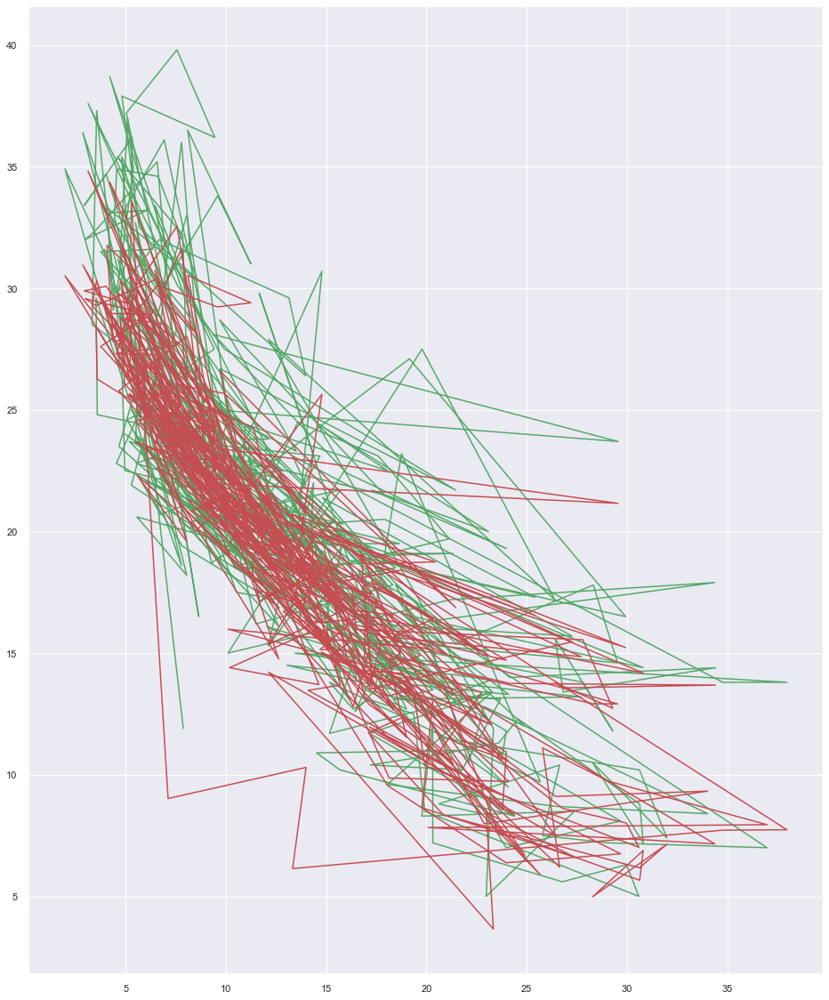

In [60]:
plt.plot(inputs_all['LSTAT'], outputs_all, "g-")
plt.plot(inputs_all['LSTAT'], pred_all, "r-")


In [78]:
a = "banana"
try:
  a = outputs_all[98]
except Exception: 
  pass
print(a)

banana


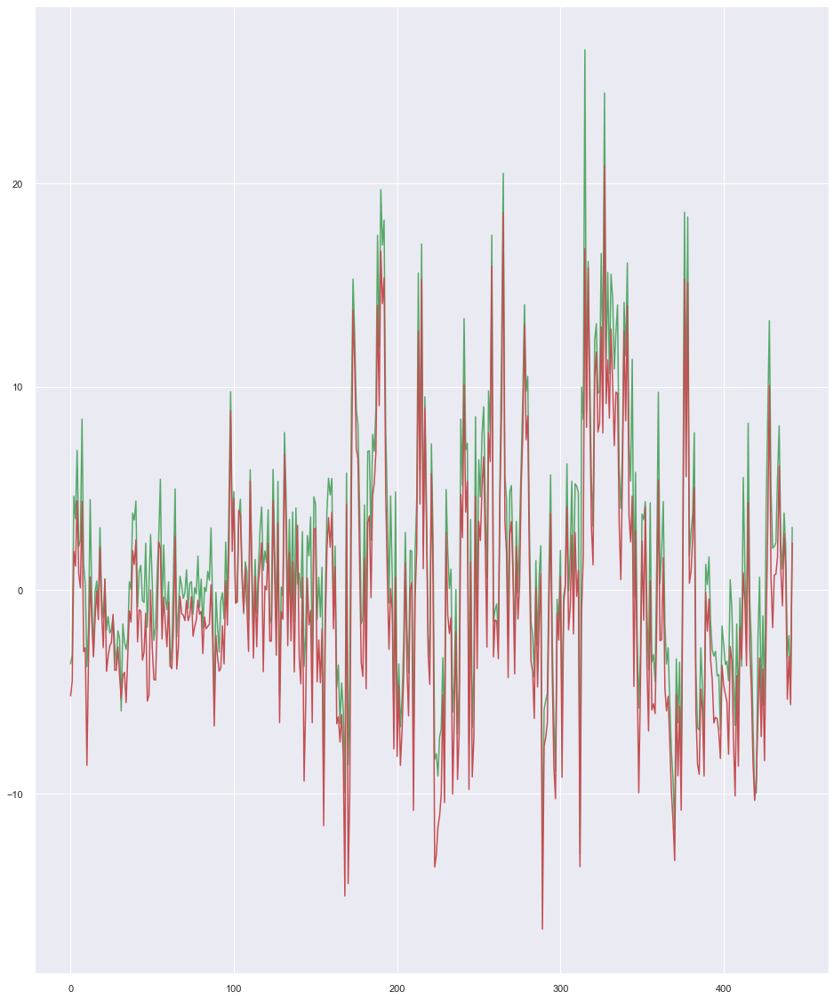

In [79]:
# Variances
var_all=[]
var_no=[]
for i in range(len(outputs_all)-1):
    try:
        var_all.append(outputs_all[i] - pred_all[i])
        var_no.append(outputs_no[i] - pred_no[i])
    except:
        pass
plt.plot(var_all, "g-")
plt.plot(var_no, "r-")

In [81]:
table = [["Mean", np.mean(var_all), np.mean(var_no)], \
         ["Minimum", np.min(var_all), np.min(var_no)], \
         ["Maximum", np.max(var_all), np.max(var_no)], \
         ["Standard Devation", np.std(var_all), np.std(var_no)]]
hdr = ["Category", "All Data", "No Outliers"]
print(tabulate(table, headers = hdr,  tablefmt="grid"))

+-------------------+------------+---------------+
| Category          |   All Data |   No Outliers |
+===================+============+===============+
| Mean              |    1.56088 |     -0.608779 |
+-------------------+------------+---------------+
| Minimum           |  -13.4198  |    -16.6617   |
+-------------------+------------+---------------+
| Maximum           |   26.5567  |     20.8526   |
+-------------------+------------+---------------+
| Standard Devation |    6.09576 |      5.93205  |
+-------------------+------------+---------------+


## (60%) Predict: ##
Again using the same notebook, use keras [7] to create a neural network that can predict the median house price based on the other variables in the dataset. You are free to interpret this as you wish — for example, you may use all the other variables, or select a subset. This part is worth 60%.

## References ##
[1] Boston Standard Metropolitan Statistical Area. Boston house prices dataset. https://www.kaggle.com/c/boston-housing.  
[2] https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155  
[3] https://pypi.org/project/tabulate/  
[4] Tensorflow Installation https://www.youtube.com/channel/UCR1-GEpyOPzT2AO4D_eifdw   
[5] Jeff Heaton Lecture 02-01  
[6] https://stackoverflow.com/questions/48590268/pandas-get-the-most-frequent-values-of-a-column  
[7] 